# Question 1
Text Statistics. Count frequencies of every term in the collection of documents (5 marks),
plot the curve of term frequencies and verify Zip’s Law (5) marks. Report the values of the
parameters for Zipf’s law for this corpus. (10 marks in total)

In [0]:
# Imports
import os
import json
import string
import numpy as np
import matplotlib.pyplot as plt 
import time
import operator
import random

In [0]:
word_dict_global = {}

def word_frequency(path): 
  start_time = time.time()
  counter = 0 
  for file in os.listdir(path):
    print(file)
    texts = []
    if counter < 109:
      # Open a document
      for x in open(path + file, 'r'):
        data = json.loads(x)
        texts.append(data['text'])
      # Clean each text by making it lower case so no duplication, removing punctuation and splitting each sentence to words   
      for s in texts:
        s = s.translate(str.maketrans('', '', string.punctuation)) 
        s = s.lower()
        s = s.split()
        # Count the frequencies 
        for word in s: 
          if word in word_dict_global:
            word_dict_global[word] += 1
          else:
            word_dict_global[word] = 1 

      counter += 1
  w_occ = sum(word_dict_global.values())
  print(w_occ)
  print(len(word_dict_global))
  end_time = time.time()
  #print(start_time - end_time)
  return word_dict_global, w_occ

In [0]:
frequency, w_occ = word_frequency("dataminingcw/wiki-pages/wiki-pages/")

wiki-100.jsonl
wiki-087.jsonl
wiki-021.jsonl
wiki-096.jsonl
wiki-057.jsonl
wiki-028.jsonl
wiki-067.jsonl
wiki-024.jsonl
wiki-053.jsonl
wiki-047.jsonl
wiki-055.jsonl
wiki-082.jsonl
wiki-014.jsonl
wiki-035.jsonl
wiki-074.jsonl
wiki-050.jsonl
wiki-093.jsonl
wiki-097.jsonl
wiki-043.jsonl
wiki-079.jsonl
wiki-098.jsonl
wiki-063.jsonl
wiki-051.jsonl
wiki-038.jsonl
wiki-091.jsonl
wiki-025.jsonl
wiki-041.jsonl
wiki-083.jsonl
wiki-044.jsonl
wiki-031.jsonl
wiki-088.jsonl
wiki-072.jsonl
wiki-058.jsonl
wiki-078.jsonl
wiki-037.jsonl
wiki-003.jsonl
wiki-086.jsonl
wiki-084.jsonl
wiki-012.jsonl
wiki-005.jsonl
wiki-052.jsonl
wiki-090.jsonl
wiki-070.jsonl
wiki-011.jsonl
wiki-061.jsonl
wiki-039.jsonl
wiki-073.jsonl
wiki-015.jsonl
wiki-064.jsonl
wiki-029.jsonl
wiki-062.jsonl
wiki-007.jsonl
wiki-010.jsonl
wiki-094.jsonl
wiki-023.jsonl
wiki-108.jsonl
wiki-101.jsonl
wiki-081.jsonl
wiki-030.jsonl
wiki-106.jsonl
wiki-006.jsonl
wiki-022.jsonl
wiki-060.jsonl
wiki-032.jsonl
wiki-054.jsonl
wiki-049.jsonl
wiki-042.j

Plotting Figure 1...


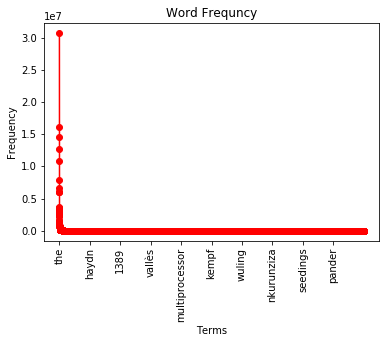

Plotting Figure 2...


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:24: RuntimeWarning: divide by zero encountered in log


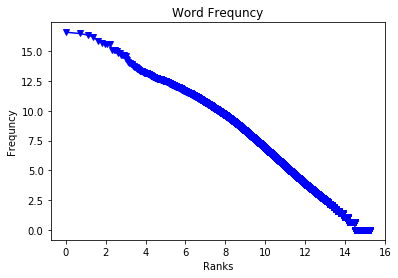

In [0]:
# Plot the the curve of term frequencies
sorted_frequency = sorted(frequency.items(), key=operator.itemgetter(1), reverse=True)
words, freq, words2 = [], [], [] 

#Rank the words and plot the log
counter = 0
for x, y in sorted_frequency: 
  freq.append(y)
  words.append(counter)
  words2.append(x)
  counter += 1

#print the first 1000
print("Plotting Figure 1...")
plt.xticks(np.arange(0,150000,15000),rotation=90)
plt.ticklabel_format(axis='y', style='sci')
plt.plot(words2[:150000], freq[:150000], 'ro-')
plt.xlabel("Terms")
plt.ylabel("Frequency")
plt.title("Word Frequncy")
plt.show()

print("Plotting Figure 2...")
plt.ticklabel_format(axis='y', style='sci')
plt.plot(np.log(words), np.log(freq), 'bv-')
plt.xlabel("Ranks")
plt.ylabel("Frequncy")
plt.title("Zipf's Law")
plt.show()

In [0]:
#Values of the parameters for Zipf’s law
#Randomly choose 10 words from the first 400 words
#Approximately each value should be close to 0.1
terms = []
for x in range(10):
  term = random.choice(words[1:400])
  terms.append(term)

average = 0
for x in terms:
  res = freq[x] / w_occ
  final = res * x
  average += final
  print(x)
  print(final)

average_res = average / 10
print("Average value of the parameters of randomly chosen 10 words: ", average_res)

228
0.09354752888526696
298
0.0992039588085855
258
0.09508659696339497
259
0.09534832953517702
159
0.08779552421112066
59
0.06601638453884759
287
0.09843075674896914
317
0.10040231779586153
298
0.0992039588085855
8
0.1053732797970816
Average value of the parameters of randomly chosen 10 words:  0.09404086360928905


# Question 2 
Vector Space Document retrieval. Extract TF-IDF representations of the 10 claims and all the
documents respectively based on the document collection. The goal of this representation
to later compute the cosine similarity between the document and the claims. Hence, for
computational efficiency, you are allowed to represent the documents only based on the
words that would have an effect on the cosine similarity computation (5 marks). Given a
claim, compute its cosine similarity with each document and return the document ID (the
"id" field in the wiki-page) of the five most similar documents for that claim (5 marks). (10
marks in total)

In [0]:
#Globals
final_claims = []
TOTAL_DOCS_DICT = {}
TOTAL_TF = {}
q3_DOCUMENTS_DICT = {}

#Get unique words and get rid of words that do not add any value to the sentences 
#Splicing could be done to make this even more accurate
def get_unique_words(claims): 
  result = []
  #Remove these words so we don't have to check for efficiency 
  filler_words = ['with', 'the', 'is', 'a', 'of', 'includes', 'and', 'an', 'based', 'on', 'their', 'at', 'has', 'new', 'in', 'there'] 
  for i in claims: 
    for x in i: 
      if x not in result: 
        result.append(x)
  for i in filler_words: 
    result.remove(i)
  return result

#Function for term frequencies
def TF(path): 
  c = 0
  ID = [75397, 150448, 214861, 156709, 129629, 33078, 6744, 226034, 40190, 76253]
  word_dict = {} 
  final_dict = {}
  claims, ids = [], []
  for x in open(path, 'r'):
      data = json.loads(x)
      if data['id'] in ID: 
        claims.append(data['claim'])
        ids.append(data['id'])
  for claim in claims:
    claim = claim.translate(str.maketrans('', '', string.punctuation)) 
    claim = claim.lower()
    claim = claim.split()
    final_claims.append(claim)
  unique_words = get_unique_words(final_claims)
  for i in ids: 
    word_dict[i] = final_claims[c]
    c += 1
  for key, value in word_dict.items(): 
    temp_dict = {}
    size = len(value)
    for v in value: 
      if key in temp_dict:
        temp_dict[v] += 1
      else:
        temp_dict[v] = 1 
    for i, j in temp_dict.items(): 
      temp_dict[i] = j/size
    final_dict[key] = temp_dict
  #print(len(unique_words), unique_words)
  return final_dict, unique_words

def invert_index_and_IDF(path): 
  word_dict = {}
  #Just to check if returned correctly 
  rel_Doc_Ids = ['1118_Hanskya']
  _, unique_words = TF("dataminingcw/train.jsonl") 
  count = 0
  for x in unique_words:
    count += 1
    temp_dict = {}
    temp_dict2 = {}
    print(count)
    for file in os.listdir(path):
      for y in open(path + file, 'r'):
        data = json.loads(y)
        s = data['text']
        ID = data['id']
        s = s.translate(str.maketrans('', '', string.punctuation)) 
        s = s.lower()
        s = s.split() 
        if ID in rel_Doc_Ids:
          q3_DOCUMENTS_DICT[ID] = s
        if x in s: 
          c = 0 
          for word in s: 
            if word == x: 
              c += 1
          temp_dict[ID] = c / len(s)
          temp_dict2[ID] = c
          TOTAL_DOCS_DICT[ID] = len(s)
    word_dict[x] = temp_dict
    TOTAL_TF[x] = temp_dict2
  print(q3_DOCUMENTS_DICT)
  return word_dict

In [0]:
frequency2 = invert_index_and_IDF('dataminingcw/wiki-pages/wiki-pages/')

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
{'1118_Hanskya': ['1118', 'hanskya', 'provisional', 'designation', '1927', 'qd', 'is', 'a', 'dark', 'asteroid', 'from', 'the', 'asteroid', 'belt', 'about', '77', 'kilometers', 'in', 'diameter', 'it', 'was', 'discovered', 'by', 'russian', 'astronomers', 'sergey', 'belyavsky', 'and', 'nikolaj', 'ivanov', 'at', 'the', 'crimean', 'simeiz', 'observatory', 'on', '29', 'august', '1927', 'the', 'asteroid', 'was', 'independently', 'discovered', 'by', 'two', 'other', 'prolific', 'astronomers', 'in', 'the', 'field', 'namely', 'karl', 'reinmuth', 'at', 'the', 'german', 'heidelberg', 'observatory', 'who', 'observed', 'the', 'body', 'only', 'one', 'day', 'later', 'and', 'announced', 'it', 'first', 'and', 'by', 'belgian', 'astronomer', 'eugène', 'delporte', 'at', 'the', 'royal', 'observatory', 'uccle', 'on', '17', 'se

In [0]:
def IDF(dictionary): 
  #Perform the IDF 
  IDF_dict = {}
  total_documents = 5416536
  #total_documents = 49999
  for key,value in dictionary.items(): 
    docs_length = len(dictionary[key])
    if docs_length != 0:
      idf = 1 + np.log(total_documents/docs_length)
    else:
      #Since some values do not appear
      idf = 1
    IDF_dict[key] = idf
  return IDF_dict

def TF_IDF(dictionary, path): 
  filler_words = ['with', 'the', 'is', 'a', 'of', 'includes', 'and', 'an', 'based', 'on', 'their', 'at', 'has', 'new', 'in', 'there']
  tf_idf_dict = {}
  tf_dict, _ = TF(path)
  for key, val in tf_dict.items(): 
    tmp_dict = {}
    for x, y in val.items(): 
      if x not in filler_words: 
        tmp_dict[x] = dictionary[x] * y
      else: 
        tmp_dict[x] = y
      tf_idf_dict[key] = tmp_dict
      
  iiD = frequency2
  tf_idf_docs = {}
  for k, v in iiD.items():
    tmp_dict = {}
    for a, b in v.items():
      tmp_dict[a] = dictionary[k] * b 
    tf_idf_docs[k] = tmp_dict
  return tf_idf_dict, tf_idf_docs

In [0]:
result = IDF(frequency2)

In [0]:
final_claims = []
a, b = TF_IDF(result, 'dataminingcw/train.jsonl')

filler = ['with', 'the', 'is', 'a', 'of', 'includes', 'and', 'an', 'based', 'on', 'their', 'at', 'has', 'new', 'in', 'there']

temp_final = []

for claim in final_claims:
  tmp_list = []
  for word in claim:
    if not word in filler:
      tmp_list.append(word)
  temp_final.append(tmp_list)
final_claims = temp_final 
print(final_claims)


[['nikolaj', 'costerwaldau', 'worked', 'fox', 'broadcasting', 'company'], ['roman', 'atwood', 'content', 'creator'], ['history', 'art', 'architecture', 'dance', 'sculpture', 'music', 'painting', 'poetry', 'literature', 'theatre', 'narrative', 'film', 'photography', 'graphic', 'arts'], ['adrienne', 'bailon', 'accountant'], ['homeland', 'american', 'television', 'spy', 'thriller', 'israeli', 'television', 'series', 'prisoners', 'war'], ['boston', 'celtics', 'play', 'home', 'games', 'td', 'garden'], ['ten', 'commandments', 'epic', 'film'], ['tetris', 'sold', 'millions', 'physical', 'copies'], ['cyndi', 'lauper', 'won', 'best', 'artist', 'award', '27th', 'grammy', 'awards', '1985'], ['movie', 'called', 'hunger', 'games']]


In [0]:
print(a)
print(b)

{75397: {'nikolaj': 1.3917911283220448, 'costerwaldau': 1.618702374151826, 'worked': 0.6256889885602229, 'with': 0.125, 'the': 0.125, 'fox': 0.8361591253898203, 'broadcasting': 0.7843551468257125, 'company': 0.5442388017162507}, 150448: {'roman': 0.911333151176649, 'atwood': 1.7104572982081427, 'is': 0.16666666666666666, 'a': 0.16666666666666666, 'content': 1.0979540894892597, 'creator': 1.232831948234311}, 214861: {'history': 0.2591554175677905, 'of': 0.05555555555555555, 'art': 0.28619870776877177, 'includes': 0.05555555555555555, 'architecture': 0.3480539751054837, 'dance': 0.34845620704973856, 'sculpture': 0.4090622043985077, 'music': 0.24015600417899247, 'painting': 0.37136004159284997, 'poetry': 0.3706522797338089, 'literature': 0.3380859411685421, 'theatre': 0.3279732735895788, 'narrative': 0.42575907967902504, 'film': 0.22353157549620284, 'photography': 0.40674911871654007, 'and': 0.05555555555555555, 'graphic': 0.4117998454701304, 'arts': 0.30323048998952884}, 156709: {'adrien

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [0]:
#Gets you the final documents (bad naming of the function, change for next time)
def relevant_claims(): 
  final_docs = []
  for claim in final_claims:
    claim = set(claim)
    tmp_claims = []
    for word in claim: 
      if word in b.keys():
        tmp = b[word]
        for x in tmp: 
          tmp_claims.append(x)
    final_docs.append(tmp_claims)
  return final_docs

def final_cos_similarity(): 
  cos_sim = {}
  count = 0 
  ID = [75397, 150448, 214861, 156709, 129629, 33078, 6744, 226034, 40190, 76253]
  rel_docs = relevant_claims()
  
  for claim in final_claims:
    print(claim)
    rel_docs2 = rel_docs[count]
    t_dict = {}
    for doc in rel_docs2: 
      document_TFIDF, claim_TFIDF = [], []
      tmp = a[ID[count]]
      for word in tmp: 
        claim_TFIDF.append(tmp[word])
        if word in b: 
          tmp2 = b[word]
        if doc in tmp2: 
          document_TFIDF.append(tmp2[doc])
        else: 
          document_TFIDF.append(0.0)
          
      size_of_claim = 0
      for x in claim_TFIDF:
        size_of_claim += x ** 2
      size_of_claim = np.sqrt(size_of_claim)

      size_of_document = 0
      for x in document_TFIDF:
        size_of_document += x ** 2
      size_of_document = np.sqrt(size_of_document)

      res = 0
      for x, y in zip(claim_TFIDF, document_TFIDF):
        res += x * y
        
      cosine_sim_res = res / (size_of_claim * size_of_document)
      t_dict[doc] = cosine_sim_res
       
    
    cos_sim[ID[count]] = t_dict
    count += 1
  for k, v in cos_sim.items(): 
    res = sorted(v.items(), key=operator.itemgetter(1), reverse=True)
    print(k, res[:5])
  #print(cos_sim)
  return cos_sim

final_cos_similarity()

['nikolaj', 'costerwaldau', 'worked', 'fox', 'broadcasting', 'company']
['roman', 'atwood', 'content', 'creator']
['history', 'art', 'architecture', 'dance', 'sculpture', 'music', 'painting', 'poetry', 'literature', 'theatre', 'narrative', 'film', 'photography', 'graphic', 'arts']
['adrienne', 'bailon', 'accountant']
['homeland', 'american', 'television', 'spy', 'thriller', 'israeli', 'television', 'series', 'prisoners', 'war']
['boston', 'celtics', 'play', 'home', 'games', 'td', 'garden']
['ten', 'commandments', 'epic', 'film']
['tetris', 'sold', 'millions', 'physical', 'copies']
['cyndi', 'lauper', 'won', 'best', 'artist', 'award', '27th', 'grammy', 'awards', '1985']
['movie', 'called', 'hunger', 'games']
75397 [('New_Amsterdam_-LRB-TV_series-RRB-', 0.8930666477301903), ('Gods_of_Egypt_-LRB-film-RRB-', 0.8581522906494934), ('Nikolaj_Coster-Waldau', 0.8564135245677494), ('The_Other_Woman_-LRB-2014_film-RRB-', 0.8564135245677493), ('Small_Crimes', 0.8315546272574746)]
150448 [('Giancar

{6744: {'Thou_shalt_not_take_the_name_of_the_Lord_thy_God_in_vain': 0.5787717079904084,
  'Thou_shalt_not_commit_adultery': 0.5787717079904086,
  'Thou_Shalt_Not': 0.620723763223819,
  'Thou_shalt_not_steal': 0.5787717079904086,
  'Triumph_-LRB-1924_film-RRB-': 0.620723763223819,
  'Thou_Shalt_Not_Kill': 0.5553971645502067,
  'Thou_shalt_not_kill': 0.5787717079904086,
  'Tumtum_-LRB-Judaism-RRB-': 0.48663368327669737,
  "Children's_Songbook": 0.48663368327669737,
  'Cecil_B._DeMille': 0.6793875973253656,
  'Chemish': 0.4866336832766975,
  'Charlton_Heston': 0.7674809011729001,
  'Chabad_philosophy': 0.4866336832766974,
  'Catholic_Church_in_Rwanda': 0.4866336832766974,
  'Ten_Commandments_-LRB-disambiguation-RRB-': 0.5787717079904084,
  'Temple_Beth_Zion_-LRB-Buffalo,_New_York-RRB-': 0.48663368327669737,
  'Ten_Commandments_-LRB-Ozzy_Osbourne_album-RRB-': 0.5787717079904086,
  'The_New_Ten_Commandments': 0.6078238601244665,
  'The_Ten_Commandments_-LRB-Malevolent_Creation_album-RRB-': 

# Train for devSet

In [0]:
#Same structure as above, just ran for the new set of claims, code is repeated here 
#Global List 
final_claims = []
TOTAL_DOCS_DICT = {}
TOTAL_TF = {}
q3_DOCUMENTS_DICT = {}

def get_unique_words(claims): 
  result = []
  #Remove these words so we don't have to check for efficiency 
  filler_words = ['with', 'the', 'is', 'a', 'of', 'includes', 'and', 'an', 'based', 'on', 'their', 'at', 'has', 'new', 'in', 'there'] #movie, called and games
  for i in claims: 
    for x in i: 
      if x not in result: 
        result.append(x)
  for i in filler_words:
    if x in i: 
      result.remove(i)
  return result

def TF(path): 
  c = 0
  ID = [137334, 111897, 89891, 181634, 219028, 108281,204361, 54168, 105095, 18708]
  word_dict = {} 
  final_dict = {}
  claims, ids = [], []
  for x in open(path, 'r'):
      data = json.loads(x)
      if data['id'] in ID: 
        claims.append(data['claim'])
        ids.append(data['id'])
  for claim in claims:
    claim = claim.translate(str.maketrans('', '', string.punctuation)) 
    claim = claim.lower()
    claim = claim.split()
    final_claims.append(claim)
  unique_words = get_unique_words(final_claims)
  for i in ids: 
    word_dict[i] = final_claims[c]
    c += 1
  for key, value in word_dict.items(): 
    temp_dict = {}
    size = len(value)
    for v in value: 
      if key in temp_dict:
        temp_dict[v] += 1
      else:
        temp_dict[v] = 1 
    for i, j in temp_dict.items(): 
      temp_dict[i] = j/size
    final_dict[key] = temp_dict
  #print(len(unique_words), unique_words)
  return final_dict, unique_words

def invert_index_and_IDF(path): 
  word_dict = {}
  rel_Doc_Ids = ['1118_Hanskya']
  _, unique_words = TF("dataminingcw/shared_task_dev.jsonl") 
  count = 0
  for x in unique_words:
    count += 1
    temp_dict = {}
    temp_dict2 = {}
    print(count)
    for file in os.listdir(path):
      for y in open(path + file, 'r'):
        data = json.loads(y)
        s = data['text']
        ID = data['id']
        s = s.translate(str.maketrans('', '', string.punctuation)) 
        s = s.lower()
        s = s.split() 
        if ID in rel_Doc_Ids:
          q3_DOCUMENTS_DICT[ID] = s
        if x in s: 
          c = 0 
          for word in s: 
            if word == x: 
              c += 1
          temp_dict[ID] = c / len(s)
          temp_dict2[ID] = c
          TOTAL_DOCS_DICT[ID] = len(s)
    word_dict[x] = temp_dict
    TOTAL_TF[x] = temp_dict2
  print(q3_DOCUMENTS_DICT)
  return word_dict

In [0]:
frequency2 = invert_index_and_IDF('dataminingcw/wiki-pages/wiki-pages/')

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
{'1118_Hanskya': ['1118', 'hanskya', 'provisional', 'designation', '1927', 'qd', 'is', 'a', 'dark', 'asteroid', 'from', 'the', 'asteroid', 'belt', 'about', '77', 'kilometers', 'in', 'diameter', 'it', 'was', 'discovered', 'by', 'russian', 'astronomers', 'sergey', 'belyavsky', 'and', 'nikolaj', 'ivanov', 'at', 'the', 'crimean', 'simeiz', 'observatory', 'on', '29', 'august', '1927', 'the', 'asteroid', 'was', 'independently', 'discovered', 'by', 'two', 'other', 'prolific', 'astronomers', 'in', 'the', 'field', 'namely', 'karl', 'reinmuth', 'at', 'the', 'german', 'heidelberg', 'observatory', 'who', 'observed', 'the', 'body', 'only', 'one', 'day', 'later', 'and', 'announced', 'it', 'first', 'and', 'by', 'belgian', 'astronomer', 'eugène', 'delporte', 'at', 'the', 'royal', 'observatory', 'uccle', 'on', '17', 'september', 'the', 'mainbelt', '

In [0]:
def IDF(dictionary): 
  #Perform the IDF 
  IDF_dict = {}
  #total_documents = 5416536
  #total_documents = 49999
  total_documents = 50000 #For dev_set
  for key,value in dictionary.items(): 
    docs_length = len(dictionary[key])
    if docs_length != 0:
      idf = 1 + np.log(total_documents/docs_length)
    else:
      #Since some values do not appear
      idf = 1
    IDF_dict[key] = idf
  return IDF_dict

def TF_IDF(dictionary, path): 
  filler_words = ['with', 'the', 'is', 'a', 'of', 'includes', 'and', 'an', 'based', 'on', 'their', 'at', 'has', 'new', 'in', 'there']
  tf_idf_dict = {}
  tf_dict, _ = TF(path)
  for key, val in tf_dict.items(): 
    tmp_dict = {}
    for x, y in val.items(): 
      if x not in filler_words: 
        tmp_dict[x] = dictionary[x] * y
      else: 
        tmp_dict[x] = y
      tf_idf_dict[key] = tmp_dict
      
  iiD = frequency2
  tf_idf_docs = {}
  for k, v in iiD.items():
    tmp_dict = {}
    for a, b in v.items():
      tmp_dict[a] = dictionary[k] * b 
    tf_idf_docs[k] = tmp_dict
  return tf_idf_dict, tf_idf_docs

In [0]:
result = IDF(frequency2)

In [0]:
final_claims = []
a, b = TF_IDF(result, 'dataminingcw/shared_task_dev.jsonl')

filler = ['with', 'the', 'is', 'a', 'of', 'includes', 'and', 'an', 'based', 'on', 'their', 'at', 'has', 'new', 'in', 'there']

temp_final = []

for claim in final_claims:
  tmp_list = []
  for word in claim:
    if not word in filler:
      tmp_list.append(word)
  temp_final.append(tmp_list)
final_claims = temp_final 
print(final_claims)

[['fox', '2000', 'pictures', 'released', 'film', 'soul', 'food'], ['telemundo', 'englishlanguage', 'television', 'network'], ['damon', 'albarns', 'debut', 'album', 'was', 'released', '2011'], ['capital', 'called', 'mogadishu'], ['savages', 'was', 'exclusively', 'german', 'film'], ['andrew', 'kevin', 'walker', 'only', 'chinese'], ['cretaceous', 'ended'], ['murda', 'beatzs', 'real', 'name', 'marshall', 'mathers'], ['nicholas', 'brody', 'character', 'homeland'], ['charles', 'manson', 'been', 'proven', 'innocent', 'all', 'crimes']]


In [0]:
def relevant_claims(): 
  final_docs = []
  for claim in final_claims:
    claim = set(claim)
    tmp_claims = []
    for word in claim: 
      if word in b.keys():
        tmp = b[word]
        for x in tmp: 
          tmp_claims.append(x)
    final_docs.append(tmp_claims)
  return final_docs

def final_cos_similarity(): 
  cos_sim = {}
  count = 0 
  ID = [137334, 111897, 89891, 181634, 219028, 108281,204361, 54168, 105095, 18708]
  rel_docs = relevant_claims()
  
  for claim in final_claims:
    #print(claim)
    rel_docs2 = rel_docs[count]
    t_dict = {}
    for doc in rel_docs2: 
      document_TFIDF, claim_TFIDF = [], []
      tmp = a[ID[count]]
      for word in tmp: 
        claim_TFIDF.append(tmp[word])
        if word in b: 
          tmp2 = b[word]
        if doc in tmp2: 
          document_TFIDF.append(tmp2[doc])
        else: 
          document_TFIDF.append(0.0)
          
      size_of_claim = 0
      for x in claim_TFIDF:
        size_of_claim += x ** 2
      size_of_claim = np.sqrt(size_of_claim)

      size_of_document = 0
      for x in document_TFIDF:
        size_of_document += x ** 2
      size_of_document = np.sqrt(size_of_document)

      res = 0
      for x, y in zip(claim_TFIDF, document_TFIDF):
        res += x * y
        
      cosine_sim_res = res / (size_of_claim * size_of_document)
      t_dict[doc] = cosine_sim_res
       
    
    cos_sim[ID[count]] = t_dict
    count += 1
  for k, v in cos_sim.items(): 
    res = sorted(v.items(), key=operator.itemgetter(1), reverse=True)
    print(k, res[:5])
  #print(cos_sim)
  return cos_sim

final_cos_similarity()

['fox', '2000', 'pictures', 'released', 'film', 'soul', 'food']
['telemundo', 'englishlanguage', 'television', 'network']
['damon', 'albarns', 'debut', 'album', 'was', 'released', '2011']
['capital', 'called', 'mogadishu']
['savages', 'was', 'exclusively', 'german', 'film']
['andrew', 'kevin', 'walker', 'only', 'chinese']
['cretaceous', 'ended']
['murda', 'beatzs', 'real', 'name', 'marshall', 'mathers']
['nicholas', 'brody', 'character', 'homeland']
['charles', 'manson', 'been', 'proven', 'innocent', 'all', 'crimes']
137334 [('Amy_LaVere', 0.7506999009318281), ('One_Hour_Photo', 0.7008825514002197), ('Gordon_Stulberg', 0.6931852841668574), ('John_Lafia', 0.6931219558088028), ('Milton_Sperling', 0.6931219558088028)]
111897 [('Ángel_Ramos_-LRB-industrialist-RRB-', 0.8389545980506238), ('2008_Summer_Olympics_on_NBC', 0.8389545980506237), ("List_of_Charlie's_Angels_characters", 0.8389545980506236), ('2018_Winter_Olympics_on_NBC', 0.8389545980506236), ('2007_Latin_Billboard_Music_Awards', 0

{18708: {'Transgender_rights_in_the_United_States': -0.09805535790833883,
  'True_Detective_-LRB-season_1-RRB-': -0.09299033892626053,
  'Trostruki_surduk': -0.07855859397211244,
  'Trial_of_Mihailović_et_al.': -0.09520778510647657,
  'Truth_Commission_-LRB-Chad-RRB-': -0.05107604944882757,
  'Transit_police': -0.05265389583374468,
  'Trust_No_Fox_on_his_Green_Heath_and_No_Jew_on_his_Oath': -0.007746945563658566,
  'Théophile_Bidard': -0.0833708148747222,
  'Treason_Felony_Act_1848': -0.07536601139038424,
  'True_crime': 0.23241509320679823,
  'Treaty_of_New_York': -0.058911146064415,
  'Truth-seeking': -0.0723738518594791,
  'Three_on_a_Meathook': 0.383836185074542,
  'True_Crimes': 0.014869812998334968,
  'Treason_Act_1714': -0.09704812712783525,
  'Tom_Starr': -0.0723738518594791,
  'Troop_1500': -0.08317674503101058,
  'Treblinka_extermination_camp': -0.10019158187250674,
  'Tiger_Force': 0.04433580283412316,
  'Tihomir_Orešković_-LRB-officer-RRB-': -0.014322900729125631,
  'Tony_A

# Question 3
Probabilistic Document Retrieval. Establish a query-likelihood unigram language model
based on the document collection, and return the five most similar documents for each one of
the 10 claims (5 marks). Implement and apply Laplace Smoothing, Jelinek-Mercer Smoothing
and Dirichlet Smoothing to the query-likelihood language model, return the five most similar
documents for the 10 claims (5 marks). (10 marks in total)

In [0]:
#documents = relevant_claims()
#3143585
#455831688

def get_top5(dictionary): 
  for k, v in dictionary.items(): 
    res = sorted(v.items(), key=operator.itemgetter(1), reverse=True)
    print(k, res[:5])

def get_q3_documents():
  #ID = [137334, 111897, 89891, 181634, 219028, 108281,204361, 54168, 105095, 18708]
  ID = [75397, 150448, 214861, 156709, 129629, 33078, 6744, 226034, 40190, 76253]
  count = 0 
  final_dict = {}
  for claim in final_claims: 
    tmp_list = []
    for word in claim: 
      tmp_list2 = []
      if word in frequency2: 
        tmp_dict = frequency2[word]
        for k in tmp_dict.keys(): 
          tmp_list2.append(k)
      tmp_list.append(tmp_list2) 
    final_dict[ID[count]] = tmp_list
    count += 1
  return final_dict

documents = get_q3_documents()
#print(documents[75397])

def query_likelihood_unigram():
  #ID = [137334, 111897, 89891, 181634, 219028, 108281,204361, 54168, 105095, 18708]
  ID = [75397, 150448, 214861, 156709, 129629, 33078, 6744, 226034, 40190, 76253]
  count = 0 
  final_dict = {}
  for k, v in documents.items():  
    validate = []
    for x in v:
      res_tmp = set(x)
      validate.append(res_tmp)
    res = set.intersection(*validate)
    final_dict[k] = res
  
  count = 0 
  final_result_dict = {}
  for k, v in final_dict.items(): 
    tmp_dict2 = {}
    for doc in v: 
      res_ = 0 
      for word in a[ID[count]]: 
          if word in frequency2: 
            tmp_dict = frequency2[word]
            res_ += np.log(tmp_dict[doc] / TOTAL_DOCS_DICT[doc])
      tmp_dict2[doc] = res_
    final_result_dict[ID[count]] = tmp_dict2
    count += 1  
  print(get_top5(final_result_dict))
  return final_result_dict

def laplace_smoothing(): 
  #ID = [137334, 111897, 89891, 181634, 219028, 108281,204361, 54168, 105095, 18708]
  ID = [75397, 150448, 214861, 156709, 129629, 33078, 6744, 226034, 40190, 76253]
  count = 0   
  final_result_dict = {}
  for v in documents.values(): 
    tmp_dict2 = {}
    for doc in v: 
      for d in doc:
        res = 0 
        for word in final_claims[count]: 
          if word in frequency2:
            tmp_dict = TOTAL_TF[word]
            if d in tmp_dict:
              m_ = tmp_dict[d] + 1
              n_ = TOTAL_DOCS_DICT[d] + len(word_dict_global)
              res += ((m_) / (n_)) 
            else: 
              m_ = 1
              n_ = TOTAL_DOCS_DICT[d] + len(word_dict_global)
              res += np.log(((m_) / (n_)))
        tmp_dict2[d] = res
      indexing = ID[count]
      final_result_dict[indexing] = tmp_dict2
    count += 1 
    
  print(get_top5(final_result_dict))
  return final_result_dict

def jelinek_mercer_smoothing(): 
  #ID = [137334, 111897, 89891, 181634, 219028, 108281,204361, 54168, 105095, 18708]
  ID = [75397, 150448, 214861, 156709, 129629, 33078, 6744, 226034, 40190, 76253]
  count = 0   
  final_result_dict = {}
  lambda_ = 0.5
  for v in documents.values(): 
    tmp_dict2 = {}
    for doc in v: 
      for d in doc:
        res = 0 
        for word in final_claims[count]: 
          if word in frequency2:
            tmp_dict = TOTAL_TF[word]
            if d in tmp_dict:
              m_ = tmp_dict[d] 
              n_ = TOTAL_DOCS_DICT[d]
              res += np.log((((((m_) / (n_)) * lambda_) + word_dict_global[word]) / 455831688))
        tmp_dict2[d] = res
      indexing = ID[count]
      final_result_dict[indexing] = tmp_dict2
    count += 1 
    
  print(get_top5(final_result_dict))
  return final_result_dict

def dirichlet_smoothing(): 
  #ID = [137334, 111897, 89891, 181634, 219028, 108281,204361, 54168, 105095, 18708]
  ID = [75397, 150448, 214861, 156709, 129629, 33078, 6744, 226034, 40190, 76253]
  count = 0   
  final_result_dict = {}
  lambda_ = 0.5
  #mu = 3143585 / 49999
  mu = 455831688 / 5416536
  #mu = 3143585 / 50000
  for v in documents.values(): 
    tmp_dict2 = {}
    for doc in v: 
      for d in doc:
        res = 0 
        for word in final_claims[count]: 
          if word in frequency2:
            tmp_dict = TOTAL_TF[word]
            if d in tmp_dict:
              m_ = TOTAL_DOCS_DICT[d]/(TOTAL_DOCS_DICT[d] + mu) 
              n_ = ((tmp_dict[d]) / (TOTAL_DOCS_DICT[d]))
              bg = ((word_dict_global[word] / 455831688) * (1-m_))
              res += np.log((m_ * n_) + bg)
        tmp_dict2[d] = res
      indexing = ID[count]
      final_result_dict[indexing] = tmp_dict2
    count += 1 
    
  print(get_top5(final_result_dict))
  return final_result_dict

test0 = query_likelihood_unigram()
test = laplace_smoothing()
test2 = jelinek_mercer_smoothing()
test3 = dirichlet_smoothing()

#Randomly fill in those that are not filled and mention why in the report

75397 []
150448 []
214861 [('History_of_art', -173.81917781565525)]
156709 []
129629 [('Homeland_-LRB-TV_series-RRB-', -97.14964041874728)]
33078 [('List_of_Boston_Celtics_head_coaches', -75.26364751285323), ('Boston_Celtics', -78.05898390540582), ('Red_Auerbach', -80.56652597448415)]
6744 [('Katherine_Orrison', -29.58036989078614), ('The_Nth_Commandment', -33.22506324051902), ('The_King_of_Kings_-LRB-1927_film-RRB-', -33.846757727730534), ('Debra_Paget', -34.101439016330524), ('Fredric_M._Frank', -34.32367552918713)]
226034 []
40190 [('Cyndi_Lauper', -113.7738706543139)]
76253 [('The_Hunger_Games', -40.917705448604394), ('Laurie_Spiegel', -42.05996297622225), ('Master_Shake', -42.34603164776373), ('Carl_Brutananadilewski', -43.8230160780216), ('Josh_Hutcherson', -44.66797047025359)]
None
75397 [('Jim_Paymar', -30.531857646060693), ('Carol_Iovanna', -30.5318703075197), ('Melinda_Jacobs_Grodnick', -30.53190266421567), ('Hotel_Russell-Lamson', -30.531914387527234), ('James_Robert_Parish'

# Question 4
Sentence Relevance. For a claim in the training subset and the retrieved five documents for
this claim (either based on cosine similarity or the query likelihood model), represent the claim
and sentences in these documents based on a word embedding method, (such as Word2Vec,
GloVe, FastText or ELMo) (5 marks). With these embeddings as input, implement a logistic
regression model trained on the training subset (5 marks). Use this model to identify five
relevant documents to the claims in the development data and select the five most relevant
sentences for a given claim within these documents. Report the performance of your system
in this dataset using an evaluation metric you think would fit to this task. Analyze the effect
of the learning rate on the model training loss (5 marks). Instead of using Python sklearn or
other packages, the implementations of the logistic regression algorithm should be your own.
(15 marks in total)



In [0]:
#Gensim's import and word2vec - Adapted from https://radimrehurek.com/gensim/models/word2vec.html
from gensim.test.utils import common_texts, get_tmpfile
from gensim.models import Word2Vec
import gensim.downloader as api

path = get_tmpfile("word2vec.model")
model = Word2Vec(common_texts, size=100, window=5, min_count=1, workers=4)
model.save("word2vec.model")
model = Word2Vec.load("word2vec.model")
w_vecs = api.load("glove-wiki-gigaword-100")

paramiko missing, opening SSH/SCP/SFTP paths will be disabled.  `pip install paramiko` to suppress


[==================================================] 100.0% 128.1/128.1MB downloaded


In [0]:
def word2Vec_embedding(sentences): 
  vec_res = np.zeros(100)
  for w in sentences: 
    if w in w_vecs: 
      vec_res += w_vecs[w]
    #Normalise
    vec_res /= len(sentences)
  return vec_res
    #print(vec_res)

In [0]:
#Read all the claims
rel_docID_sent = {}
CLAIM_WORD2VEC = {}

def relevant_train():
  rel_docID_sent_test = {}
  for claim in open('dataminingcw/train.jsonl', 'r'):
    data = json.loads(claim)
    CLAIM = data['claim']
    _ID = data['id']
    EVIDENCE = data['evidence']
    CLAIM = CLAIM.translate(str.maketrans('', '', string.punctuation)).lower().split()
    CLAIM_WORD2VEC[_ID] = word2Vec_embedding(CLAIM)
    #{CLAIMID:{DOCID:[SENTENCEID]}}
    tmp = {}
    for ev in EVIDENCE: 
      for e in ev: 
        _, _, d, s = e
        if d in tmp:
          if d is not None:
            tmp2 = tmp[d]
            tmp2.append(s)
            tmp[d] = tmp2
        else: 
          tmp[d] = [s]

    rel_docID_sent_test[_ID] = tmp
    
  return rel_docID_sent_test
    
rel_docID_sent = relevant_train()
      

In [0]:
FINAL_REL_DOCS = {}

def remove_chars(s):
    return s[2:]

def reldocs(path):
  d_id = set() 
  for v in rel_docID_sent.values():
    for k in v.keys(): 
      d_id.add(k)
    
  for file in os.listdir(path):
    for y in open(path + file, 'r'):
      data = json.loads(y)
      _ID2 = data['id']
      if _ID2 in d_id: 
        #Split by lines
        c = 0
        lines = data['lines'].split('\n')
        tmp = {}
        for l in lines: 
          stripped = remove_chars(l).replace("\t", " ")
          tmp[c] = stripped
          c += 1
        FINAL_REL_DOCS[_ID2] = tmp
  #print(len(FINAL_REL_DOCS['10_Cloverfield_Lane']))
  return FINAL_REL_DOCS  
 

reldocs('dataminingcw/wiki-pages/wiki-pages/')  



{'Tobey_Maguire': {0: "Tobias Vincent `` Tobey '' Maguire -LRB- born June 27 , 1975 -RRB- is an American actor and producer .",
  1: 'He began his career in the late 1980s .',
  2: 'His first appearance in a feature film was a non-speaking part in The Wizard -LRB- 1989 -RRB- . The Wizard The Wizard (film)',
  3: "He is known for playing the title character in Sam Raimi 's Spider-Man film trilogy -LRB- 2002 , 2004 , and 2007 -RRB- , as well as for his roles in Pleasantville -LRB- 1998 -RRB- , The Cider House Rules -LRB- 1999 -RRB- , Wonder Boys -LRB- 2000 -RRB- , Seabiscuit -LRB- 2003 -RRB- , The Good German -LRB- 2006 -RRB- , Brothers -LRB- 2009 -RRB- , and The Great Gatsby -LRB- 2013 -RRB- . the title character Spider-Man Sam Raimi Sam Raimi 2002 Spider-Man (2002 film) 2004 Spider-Man 2 2007 Spider-Man 3 Pleasantville Pleasantville (film) The Cider House Rules The Cider House Rules (film) Wonder Boys Wonder Boys (film) Seabiscuit Seabiscuit (film) The Good German The Good German Broth

In [0]:
#Get all the relvant positive and negative sentence 
pos_sent, neg_sent = [], []

def positive_sentences(): 
  for key, value in rel_docID_sent.items(): 
    for document_ID, sentence_ID in value.items(): 
      if document_ID in FINAL_REL_DOCS: 
        for id in sentence_ID:
          clean_sentence = FINAL_REL_DOCS[document_ID][id].translate(str.maketrans('', '', string.punctuation)).lower().split()
          claim_embed = CLAIM_WORD2VEC[key]
          first = word2Vec_embedding(clean_sentence)
          result_embed = np.concatenate([claim_embed, first])
          pos_sent.append(result_embed)
  
def negative_sentences(): 
   for key, value in rel_docID_sent.items(): 
    for document_ID, sentence_ID in value.items(): 
      if document_ID in FINAL_REL_DOCS: 
        big_list = list(range(max(sentence_ID)+1))
        use_list = list(set(big_list) - set(sentence_ID))
        for id in use_list:
          clean_sentence = FINAL_REL_DOCS[document_ID][id].translate(str.maketrans('', '', string.punctuation)).lower().split()
          claim_embed = CLAIM_WORD2VEC[key]
          neg_sent.append(np.concatenate([claim_embed, word2Vec_embedding(clean_sentence)]))

positive_sentences()
negative_sentences()
pos_sent = pos_sent[:500]
neg_sent = neg_sent[:500]


In [0]:
print(len(pos_sent), len(neg_sent))
print(pos_sent)
print(neg_sent)

500 500
[array([ 8.41080719e-02, -6.13363302e-02, -4.70728710e-02, -2.71722599e-03,
        3.15145066e-02, -1.43124102e-01,  2.15786260e-02,  2.86335790e-02,
       -2.99913510e-02, -4.55911931e-03,  1.15842732e-01, -3.08934746e-02,
        5.28381871e-02, -6.95522484e-02, -9.95615710e-02, -1.06845252e-01,
        1.38377094e-01, -1.85976300e-02,  5.67290302e-02,  2.43613211e-02,
       -5.95445523e-03, -7.61337950e-03,  4.15891496e-02,  4.24999270e-02,
       -6.72528815e-02, -1.95765589e-02, -4.83110026e-03,  5.89627142e-02,
       -6.25072581e-02, -1.80497482e-02,  3.61209987e-02,  2.07984101e-01,
       -6.91431190e-02, -8.05542378e-02, -5.83063522e-02,  5.74001191e-02,
        3.79905805e-02, -8.02205284e-04,  2.71226373e-02, -9.68707951e-02,
        8.86104255e-02, -6.90688404e-03, -7.56853263e-02, -1.59706901e-02,
       -1.84416174e-02,  6.51320196e-02, -2.42100845e-02, -4.10269346e-02,
        4.07864803e-02, -1.23438688e-01, -3.90492524e-02,  1.88221185e-02,
        5.411263

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [0]:
#Logistic Regression Model to train with the data 
def zero_list_maker(n):
    list_of_zeros = [0] * n
    return list_of_zeros
  
def ones_list_maker(n):
    list_of_ones = [1] * n
    return list_of_ones
  
pos_label = ones_list_maker(500)
neg_label = zero_list_maker(500)

pos_and_neg_sentences = pos_sent + neg_sent
pos_and_neg_labels = pos_label + neg_label

x_train = pos_and_neg_sentences
y_train = pos_and_neg_labels

def sigmoid(x):
  return (1.0 / (1.0 + np.exp(-x)))
  

def logistic_regression(data, labels, iterations=100, step_size=0.1):
  m, n = np.shape(data)
  weights = np.ones(n)
  for iters in range(iterations):
    print(iters)
    idx = list(range(m)) 
    for _ in range(m):  
      #Randomly sample our weights uniformly 
      sample = int(np.random.uniform(0, len(idx))) 
      #Create Hidden Layer
      datas = zip(data[sample], weights)
      sig = [x * y for x, y in datas]
      final_sig = sum(sig)
      hidden_layer = sigmoid(final_sig)
      #Calculate Error + Update weights
      error = labels[sample] - hidden_layer 
      weights += step_size * error * data[sample] 
  return weights

final_weights = logistic_regression(x_train, y_train)
print(final_weights)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
[-1.63411201e+00 -6.96761299e+00  4.01712225e+00 -1.21456955e+00
  2.93579524e+00 -2.92236617e-01 -8.53995433e-01 -8.19905447e+00
 -1.27154452e+00  3.44220648e-01  1.82933814e+00 -3.56296862e+00
  1.92559767e+00  5.14203349e+00  7.76472233e-01 -1.92953400e+00
  1.75527318e+00 -1.04774105e+00  1.96197901e+00  1.91847824e+00
 -7.29327901e+00 -1.15719865e+00  4.49204958e-01  2.30838547e-01
  2.19210600e+00 -8.50618898e-01 -7.07498419e+00 -1.94869093e-02
 -4.31862935e-02 -3.46589332e-01 -1.65391738e+00 -6.30685249e-01
  6.66919468e+00  2.91598718e+00 -2.82082559e+00  3.76773172e+00
  7.41615689e-01  4.10442922e+00  4.11241229e+00 -2.69734800e-01
  9.03970491e-01  6.76294026e-01 -4.37677046e+00 -3.50695009

In [0]:
#Read all the claims
rel_docID_sent_dev = {}
CLAIM_WORD2VEC_DEV = {}

def relevant_dev():
  rel_docID_sent_test = {}
  for claim in open('dataminingcw/shared_task_dev.jsonl', 'r'):
    data = json.loads(claim)
    CLAIM = data['claim']
    _ID = data['id']
    EVIDENCE = data['evidence']
    CLAIM = CLAIM.translate(str.maketrans('', '', string.punctuation)).lower().split()
    CLAIM_WORD2VEC_DEV[_ID] = word2Vec_embedding(CLAIM)
    #{CLAIMID:{DOCID:[SENTENCEID]}}
    tmp = {}
    for ev in EVIDENCE: 
      for e in ev: 
        _, _, d, s = e
        if d in tmp:
          if d is not None:
            tmp2 = tmp[d]
            tmp2.append(s)
            tmp[d] = tmp2
        else: 
          tmp[d] = [s]

    rel_docID_sent_test[_ID] = tmp
    
  return rel_docID_sent_test
    
rel_docID_sent_dev = relevant_dev()

In [0]:
FINAL_REL_DOCS_DEV = {}

def reldocs2(path):
  d_id = set() 
  for v in rel_docID_sent_dev.values():
    for k in v.keys(): 
      d_id.add(k)
    
  for file in os.listdir(path):
    for y in open(path + file, 'r'):
      data = json.loads(y)
      _ID2 = data['id']
      if _ID2 in d_id: 
        #Split by lines
        c = 0
        lines = data['lines'].split('\n')
        tmp = {}
        for l in lines: 
          stripped = remove_chars(l).replace("\t", " ")
          tmp[c] = stripped
          c += 1
        FINAL_REL_DOCS_DEV[_ID2] = tmp
  return FINAL_REL_DOCS_DEV  
 

reldocs2('dataminingcw/wiki-pages/wiki-pages/') 

{'Times_New_Roman': {0: "Times New Roman is a serif typeface commissioned by the British newspaper The Times in 1931 and designed by Stanley Morison , an advisor to the British branch of the printing equipment company Monotype , in collaboration with Victor Lardent , an artist in the Times ' advertising department . Stanley Morison Stanley Morison Victor Lardent Victor Lardent Monotype Monotype Corporation The Times The Times serif serif typeface typeface",
  1: 'Although no longer used by The Times , Times New Roman is still very common in book and general printing . The Times The Times',
  2: 'Through distribution as a standard computer font , it has become one of the most widely used typefaces in history .',
  3: '',
  4: '',
  5: "Times New Roman 's creation took place through the influence of Stanley Morison of Monotype . Stanley Morison Stanley Morison Monotype Monotype Corporation",
  6: 'Morison was an artistic director at Monotype , historian of printing and informal adviser t

In [0]:
#Get all the relvant positive and negative sentence 
pos_sent_dev, neg_sent_dev = [], []

def positive_sentences2(): 
  for key, value in rel_docID_sent_dev.items(): 
    for document_ID, sentence_ID in value.items(): 
      if document_ID in FINAL_REL_DOCS_DEV: 
        for id in sentence_ID:
          clean_sentence = FINAL_REL_DOCS_DEV[document_ID][id].translate(str.maketrans('', '', string.punctuation)).lower().split()
          claim_embed = CLAIM_WORD2VEC_DEV[key]
          pos_sent_dev.append(np.concatenate([claim_embed, word2Vec_embedding(clean_sentence)]))
  
def negative_sentences2(): 
   for key, value in rel_docID_sent_dev.items(): 
    for document_ID, sentence_ID in value.items(): 
      if document_ID in FINAL_REL_DOCS_DEV: 
        big_list = list(range(max(sentence_ID)+1))
        use_list = list(set(big_list) - set(sentence_ID))
        for id in use_list:
          clean_sentence = FINAL_REL_DOCS_DEV[document_ID][id].translate(str.maketrans('', '', string.punctuation)).lower().split()
          claim_embed = CLAIM_WORD2VEC_DEV[key]
          neg_sent_dev.append(np.concatenate([claim_embed, word2Vec_embedding(clean_sentence)]))

positive_sentences2()
negative_sentences2()
pos_sent_dev = pos_sent_dev[:200]
neg_sent_dev = neg_sent_dev[:200]

pos_label_dev = ones_list_maker(200)
neg_label_dev = zero_list_maker(200)

pos_and_neg_sentences_dev = pos_sent_dev + neg_sent_dev
pos_and_neg_labels_dev = pos_label_dev + neg_label_dev

x_test = pos_and_neg_sentences_dev
y_test = pos_and_neg_labels_dev

#print(len(x_test), len(y_test))
#print(x_test)
#print(y_test)

Accuracy:  0.0025
Accuracy:  0.0025
Accuracy:  0.0025
Accuracy:  0.0025
Accuracy:  0.0025
Accuracy:  0.0025
Accuracy:  0.0025
Accuracy:  0.0025
Accuracy:  0.0025
Accuracy:  0.0025
Accuracy:  0.005
Accuracy:  0.005
Accuracy:  0.0075
Accuracy:  0.01
Accuracy:  0.0125
Accuracy:  0.015
Accuracy:  0.0175
Accuracy:  0.02
Accuracy:  0.0225
Accuracy:  0.025
Accuracy:  0.025
Accuracy:  0.025
Accuracy:  0.025
Accuracy:  0.025
Accuracy:  0.0275
Accuracy:  0.0275
Accuracy:  0.0275
Accuracy:  0.0275
Accuracy:  0.03
Accuracy:  0.03
Accuracy:  0.03
Accuracy:  0.03
Accuracy:  0.03
Accuracy:  0.03
Accuracy:  0.03
Accuracy:  0.03
Accuracy:  0.03
Accuracy:  0.03
Accuracy:  0.03
Accuracy:  0.03
Accuracy:  0.03
Accuracy:  0.03
Accuracy:  0.03
Accuracy:  0.03
Accuracy:  0.03
Accuracy:  0.03
Accuracy:  0.03
Accuracy:  0.03
Accuracy:  0.03
Accuracy:  0.03
Accuracy:  0.03
Accuracy:  0.03
Accuracy:  0.03
Accuracy:  0.0325
Accuracy:  0.0325
Accuracy:  0.035
Accuracy:  0.035
Accuracy:  0.035
Accuracy:  0.0375
Acc

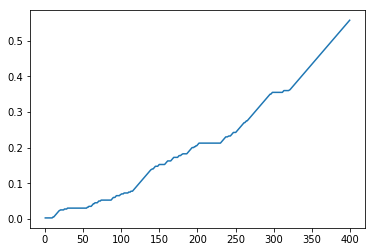

In [0]:
outputs = []

for vector in x_test:
  datas = zip(vector, final_weights)
  sig = [x * y for x, y in datas]
  final_sig = sum(sig)
  y = sigmoid(final_sig)
  output = round(y)
  if output == 0:
    outputs.append(1)
  elif output == 1:
    outputs.append(0)

accuracy_list = []
iterations = []

counter1 = 1
counter2 = 0
length = len(x_test)
final_acc = 0

for x in range(length):
  if y_test[counter2] == outputs[counter2]:
    counter1 += 1
  final_acc = counter1/length
  counter2+=1
  if counter2 % 20: 
    accuracy_list.append(final_acc)
    iterations.append(counter2)
    print("Accuracy: ", final_acc)


  
print("Accuracy : ",final_acc)
print("Error : ", 1-final_acc)

import matplotlib.pyplot as plt
plt.ticklabel_format(axis='y', style='sci')
plt.plot(iterations,accuracy_list,)
plt.show()

# Question 5
Relevance Evaluation. Implement methods to compute recall, precision and F1 metrics (5
marks). Analyze the sentence retrieval performance of your model using the labelled data in
the development subset (5 marks). (10 marks in total)

In [0]:
_x,_y = outputs, y_test 
testing = []


false_positive = 0 
true_positive = 0
true_negative = 0 
false_negative = 0 


for x in range(len(y_test)):
  testing.append((_y[x],_x[x]))

for x,y in testing:
  if x == 0 and y==1:
      false_positive +=1
  elif x == 0 and y == 0:
      true_negative +=1
  elif x == 1 and y == 1:
      true_positive +=1
  elif x == 1 and y ==0:
      false_negative +=1
      
print("False Positive:", false_positive, "True Positive:", true_positive, "True Negative:", true_negative, "False Negative:", false_negative)
      
precision = true_positive / (true_positive + false_positive)
recall =  true_positive / (true_positive + false_negative)
f1 = 2*((precision * recall) / (precision + recall))

print("Precision Score:", precision)
print("Recall Score:", recall)
print("F1 Score:", f1)

False Positive: 59 True Positive: 82 True Negative: 141 False Negative: 118
Precision Score: 0.5815602836879432
Recall Score: 0.41
F1 Score: 0.4809384164222874


# Question 6
Truthfulness of Claims. Filter out the ’NOT ENOUGH INFO’ claims and only keep the
’SUPPORTS’ or ’REFUTES’ claims in the train.jsonl and dev.jsonl datasets. Using the
relevant sentences specified in the ’evidence’ field as your training data and using their corresponding
truthfulness labels in the train.jsonl file, build a neural network based model to
assess the truthfulness of a claim in the training subset. No need to retrieve documents and
select sentences for this part, just use the sentences specified in the ’evidence’ field in the
train.jsonl and dev.jsonl.You may use existing packages like Tensorflow or PyTorch in this
subtask. You are expected to propose your own network architecture for the neural network.
Report the performance of your system in the labelled development subset using evaluation
metrics you have implemented. Furthermore, describe the motivation behind your proposed
neural architecture. The marks you get will be based on the quality and novelty of your
proposed neural network architecture, as well as its performance. (15 marks in total)

In [0]:
last_final_claims_dev = []
last_final_claims_train = []

#CLEAN UP THE CLAIMS FOR TRAIN AND TEST DATA SETS
def get_final_claims_dev(path="dataminingcw/shared_task_dev.jsonl"): 
  claims = []
  for x in open(path, 'r'):
      data = json.loads(x) 
      if data['label'] != 'NOT ENOUGH INFO':
        claims.append(data['claim'])
  for claim in claims:
    claim = claim.translate(str.maketrans('', '', string.punctuation)) 
    claim = claim.lower()
    claim = claim.split()
    last_final_claims_dev.append(claim)
  #print(len(last_final_claims_dev))
  return last_final_claims_dev

def get_final_claims_train(path="dataminingcw/train.jsonl"): 
  claims = []
  for x in open(path, 'r'):
      data = json.loads(x) 
      if data['label'] != 'NOT ENOUGH INFO':
        claims.append(data['claim'])
  for claim in claims:
    claim = claim.translate(str.maketrans('', '', string.punctuation)) 
    claim = claim.lower()
    claim = claim.split()
    last_final_claims_train.append(claim)
  #print(len(last_final_claims_train))
  return last_final_claims_train

get_final_claims_dev()
get_final_claims_train()

[['nikolaj',
  'costerwaldau',
  'worked',
  'with',
  'the',
  'fox',
  'broadcasting',
  'company'],
 ['roman', 'atwood', 'is', 'a', 'content', 'creator'],
 ['history',
  'of',
  'art',
  'includes',
  'architecture',
  'dance',
  'sculpture',
  'music',
  'painting',
  'poetry',
  'literature',
  'theatre',
  'narrative',
  'film',
  'photography',
  'and',
  'graphic',
  'arts'],
 ['adrienne', 'bailon', 'is', 'an', 'accountant'],
 ['homeland',
  'is',
  'an',
  'american',
  'television',
  'spy',
  'thriller',
  'based',
  'on',
  'the',
  'israeli',
  'television',
  'series',
  'prisoners',
  'of',
  'war'],
 ['the',
  'boston',
  'celtics',
  'play',
  'their',
  'home',
  'games',
  'at',
  'td',
  'garden'],
 ['the', 'ten', 'commandments', 'is', 'an', 'epic', 'film'],
 ['tetris', 'has', 'sold', 'millions', 'of', 'physical', 'copies'],
 ['cyndi',
  'lauper',
  'won',
  'the',
  'best',
  'new',
  'artist',
  'award',
  'at',
  'the',
  '27th',
  'grammy',
  'awards',
  'in',
 

In [0]:
#Read all the claims
rel_docID_sent_dev_FINAL = {}
CLAIM_WORD2VEC_DEV_FINAL = {}
TRUTH = {}

def relevant_dev2():
  rel_docID_sent_test = {}
  for claim in open('dataminingcw/shared_task_dev.jsonl', 'r'):
    data = json.loads(claim)
    CLAIM = data['claim']
    _ID = data['id']
    EVIDENCE = data['evidence']
    CLAIM = CLAIM.translate(str.maketrans('', '', string.punctuation)).lower().split()
    if data['label'] != 'NOT ENOUGH INFO':
      if data['label'] == 'SUPPORTS': 
        TRUTH[_ID] = 1
      elif data['label'] == 'REFUTES': 
        TRUTH[_ID] = 0
      CLAIM_WORD2VEC_DEV_FINAL[_ID] = word2Vec_embedding(CLAIM)
      tmp = {}
      for ev in EVIDENCE: 
        for e in ev: 
          _, _, d, s = e
          if d in tmp:
            if d is not None:
              tmp2 = tmp[d]
              tmp2.append(s)
              tmp[d] = tmp2
          else: 
            tmp[d] = [s]

      rel_docID_sent_test[_ID] = tmp
    
  return rel_docID_sent_test
    
rel_docID_sent_dev_FINAL = relevant_dev2()

In [0]:
FINAL_REL_DOCS_DEV_FINAL = {}

def reldocs3(path):
  d_id = set() 
  for v in rel_docID_sent_dev_FINAL.values():
    for k in v.keys(): 
      d_id.add(k)
    
  for file in os.listdir(path):
    for y in open(path + file, 'r'):
      data = json.loads(y)
      _ID2 = data['id']
      if _ID2 in d_id: 
        #Split by lines
        c = 0
        lines = data['lines'].split('\n')
        tmp = {}
        for l in lines: 
          stripped = remove_chars(l).replace("\t", " ")
          tmp[c] = stripped
          c += 1
        FINAL_REL_DOCS_DEV_FINAL[_ID2] = tmp
  return FINAL_REL_DOCS_DEV_FINAL  
 

reldocs3('dataminingcw/wiki-pages/wiki-pages/') 

{'Times_New_Roman': {0: "Times New Roman is a serif typeface commissioned by the British newspaper The Times in 1931 and designed by Stanley Morison , an advisor to the British branch of the printing equipment company Monotype , in collaboration with Victor Lardent , an artist in the Times ' advertising department . Stanley Morison Stanley Morison Victor Lardent Victor Lardent Monotype Monotype Corporation The Times The Times serif serif typeface typeface",
  1: 'Although no longer used by The Times , Times New Roman is still very common in book and general printing . The Times The Times',
  2: 'Through distribution as a standard computer font , it has become one of the most widely used typefaces in history .',
  3: '',
  4: '',
  5: "Times New Roman 's creation took place through the influence of Stanley Morison of Monotype . Stanley Morison Stanley Morison Monotype Monotype Corporation",
  6: 'Morison was an artistic director at Monotype , historian of printing and informal adviser t

In [0]:
#Get the relevant sentences and append the coorect key for Truthfulness of the claim 
pos_sent_dev2, neg_sent_dev2 = [], []
neg = []

def positive_sentences3(): 
  for key, value in rel_docID_sent_dev_FINAL.items(): 
    for document_ID, sentence_ID in value.items(): 
      if document_ID in FINAL_REL_DOCS_DEV_FINAL: 
        for id in sentence_ID:
          clean_sentence = FINAL_REL_DOCS_DEV_FINAL[document_ID][id].translate(str.maketrans('', '', string.punctuation)).lower().split()
          claim_embed = CLAIM_WORD2VEC_DEV_FINAL[key]
          pos_sent_dev2.append(np.concatenate([claim_embed, word2Vec_embedding(clean_sentence)]))
          neg.append(TRUTH[key])
          

positive_sentences3()
pos_sent_dev2 = pos_sent_dev2[:1000]
neg = neg[:1000]
#print(pos_sent_dev2)
#print(neg)

**Do the same for the training set**

In [0]:
#Read all the claims
rel_docID_sent_train_FINAL = {}
CLAIM_WORD2VEC_TRAIN_FINAL = {}
TRUTH2 = {}

def relevant_dev3():
  rel_docID_sent_test = {}
  for claim in open('dataminingcw/train.jsonl', 'r'):
    data = json.loads(claim)
    CLAIM = data['claim']
    _ID = data['id']
    EVIDENCE = data['evidence']
    CLAIM = CLAIM.translate(str.maketrans('', '', string.punctuation)).lower().split()
    if data['label'] != 'NOT ENOUGH INFO':
      if data['label'] == 'SUPPORTS': 
        TRUTH2[_ID] = 1
      elif data['label'] == 'REFUTES': 
        TRUTH2[_ID] = 0
      CLAIM_WORD2VEC_TRAIN_FINAL[_ID] = word2Vec_embedding(CLAIM)
      tmp = {}
      for ev in EVIDENCE: 
        for e in ev: 
          _, _, d, s = e
          if d in tmp:
            if d is not None:
              tmp2 = tmp[d]
              tmp2.append(s)
              tmp[d] = tmp2
          else: 
            tmp[d] = [s]

      rel_docID_sent_test[_ID] = tmp
    
  return rel_docID_sent_test
    
rel_docID_sent_train_FINAL = relevant_dev3()

In [0]:
FINAL_REL_DOCS_TRAIN_FINAL = {}

def reldocs4(path):
  d_id = set() 
  for v in rel_docID_sent_train_FINAL.values():
    for k in v.keys(): 
      d_id.add(k)
    
  for file in os.listdir(path):
    for y in open(path + file, 'r'):
      data = json.loads(y)
      _ID2 = data['id']
      if _ID2 in d_id: 
        #Split by lines
        c = 0
        lines = data['lines'].split('\n')
        tmp = {}
        for l in lines: 
          stripped = remove_chars(l).replace("\t", " ")
          tmp[c] = stripped
          c += 1
        FINAL_REL_DOCS_TRAIN_FINAL[_ID2] = tmp
  return FINAL_REL_DOCS_TRAIN_FINAL  
 

reldocs4('dataminingcw/wiki-pages/wiki-pages/') 

{'Tobey_Maguire': {0: "Tobias Vincent `` Tobey '' Maguire -LRB- born June 27 , 1975 -RRB- is an American actor and producer .",
  1: 'He began his career in the late 1980s .',
  2: 'His first appearance in a feature film was a non-speaking part in The Wizard -LRB- 1989 -RRB- . The Wizard The Wizard (film)',
  3: "He is known for playing the title character in Sam Raimi 's Spider-Man film trilogy -LRB- 2002 , 2004 , and 2007 -RRB- , as well as for his roles in Pleasantville -LRB- 1998 -RRB- , The Cider House Rules -LRB- 1999 -RRB- , Wonder Boys -LRB- 2000 -RRB- , Seabiscuit -LRB- 2003 -RRB- , The Good German -LRB- 2006 -RRB- , Brothers -LRB- 2009 -RRB- , and The Great Gatsby -LRB- 2013 -RRB- . the title character Spider-Man Sam Raimi Sam Raimi 2002 Spider-Man (2002 film) 2004 Spider-Man 2 2007 Spider-Man 3 Pleasantville Pleasantville (film) The Cider House Rules The Cider House Rules (film) Wonder Boys Wonder Boys (film) Seabiscuit Seabiscuit (film) The Good German The Good German Broth

In [0]:
pos_sent_train2, neg_sent_train2 = [], []
neg2 = []

def positive_sentences4(): 
  for key, value in rel_docID_sent_train_FINAL.items(): 
    for document_ID, sentence_ID in value.items(): 
      if document_ID in FINAL_REL_DOCS_TRAIN_FINAL: 
        for id in sentence_ID:
          clean_sentence = FINAL_REL_DOCS_TRAIN_FINAL[document_ID][id].translate(str.maketrans('', '', string.punctuation)).lower().split()
          claim_embed = CLAIM_WORD2VEC_TRAIN_FINAL[key]
          pos_sent_train2.append(np.concatenate([claim_embed, word2Vec_embedding(clean_sentence)]))
          neg2.append(TRUTH2[key])

positive_sentences4()
pos_sent_train2 = pos_sent_train2[:1000]
neg2 = neg2[:1000]
#print(pos_sent_train2)
#print(neg2)

In [0]:
x_final_train = pos_sent_train2
y_final_train = neg2
x_final_test = pos_sent_dev2
y_final_test = neg

In [0]:
x_final_train = np.asarray(x_final_train)
y_final_train = np.asarray(y_final_train)
x_final_test = np.asarray(x_final_test)
y_final_test = np.asarray(y_final_test)


In [0]:
from keras.models import Sequential
from keras.layers import Dense, Dropout
import numpy
# fix random seed for reproducibility
#numpy.random.seed(7)

print(x_final_train.shape, y_final_train.shape)
print(x_final_test.shape, y_final_test.shape)

# create model
model = Sequential()
model.add(Dense(32, input_dim=200, activation='relu'))
model.add(Dense(1, activation='sigmoid'))
# Compile model
model.compile(loss='binary_crossentropy', optimizer='sgd', metrics=['accuracy'])
# Fit the model
model.fit(x_final_train, y_final_train, epochs=150, batch_size=10)
# evaluate the model
scores = model.evaluate(x_final_test, y_final_test)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

(1000, 200) (1000,)
(1000, 200) (1000,)
Epoch 1/150
1000/1000 [==============================] - 1s 1ms/step - loss: 0.6600 - acc: 0.6920
Epoch 2/150
1000/1000 [==============================] - 0s 252us/step - loss: 0.5810 - acc: 0.7870
Epoch 3/150
1000/1000 [==============================] - 0s 276us/step - loss: 0.5415 - acc: 0.7870
Epoch 4/150
1000/1000 [==============================] - 0s 251us/step - loss: 0.5235 - acc: 0.7870
Epoch 5/150
1000/1000 [==============================] - 0s 272us/step - loss: 0.5153 - acc: 0.7870
Epoch 6/150
1000/1000 [==============================] - 0s 253us/step - loss: 0.5112 - acc: 0.7870
Epoch 7/150
1000/1000 [==============================] - 0s 257us/step - loss: 0.5089 - acc: 0.7870
Epoch 8/150
1000/1000 [==============================] - 0s 247us/step - loss: 0.5072 - acc: 0.7870
Epoch 9/150
1000/1000 [==============================] - 0s 263us/step - loss: 0.5058 - acc: 0.7870
Epoch 10/150
1000/1000 [==============================] - 0s 2

# Question 8
Propose ways to improve the machine learning models you have implemented. You can
either propose new machine learning models, new ways of sampling/using the training data,
or propose new neural architectures. You are allowed to use existing libraries/packages for
this part. Explain how your proposed method(s) differ from existing work in the literature.
The marks you get will be based on the quality and novelty of your proposed methods, as
well as the performance of your final model. (20 marks in total)

In [0]:
# create model
model = Sequential()
model.add(Dense(32, input_dim=200, activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(4, activation='relu'))
model.add(Dense(1, activation='sigmoid'))
# Compile model
model.compile(loss='binary_crossentropy', optimizer='Adam', metrics=['accuracy'])
# Fit the model
model.fit(x_final_train, y_final_train, epochs=200, batch_size=10)
# evaluate the model
scores = model.evaluate(x_final_test, y_final_test)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

Epoch 1/200
1000/1000 [==============================] - 2s 2ms/step - loss: 0.5715 - acc: 0.7760
Epoch 2/200
1000/1000 [==============================] - 0s 395us/step - loss: 0.4667 - acc: 0.7870
Epoch 3/200
1000/1000 [==============================] - 0s 347us/step - loss: 0.4325 - acc: 0.7900
Epoch 4/200
1000/1000 [==============================] - 0s 338us/step - loss: 0.4062 - acc: 0.8160
Epoch 5/200
1000/1000 [==============================] - 0s 350us/step - loss: 0.3873 - acc: 0.8320
Epoch 6/200
1000/1000 [==============================] - 0s 352us/step - loss: 0.3712 - acc: 0.8510
Epoch 7/200
1000/1000 [==============================] - 0s 335us/step - loss: 0.3515 - acc: 0.8620
Epoch 8/200
1000/1000 [==============================] - 0s 334us/step - loss: 0.3350 - acc: 0.8700
Epoch 9/200
1000/1000 [==============================] - 0s 352us/step - loss: 0.3144 - acc: 0.8820
Epoch 10/200
1000/1000 [==============================] - 0s 337us/step - loss: 0.3010 - acc: 0.8870
E

In [0]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM, Flatten
# create model
x_final_train = np.resize(x_final_train,(x_final_train.shape[0], 1, x_final_train.shape[1]))
model = Sequential()
#x_final_train.reshape([200000,1,1])
model.add(LSTM(128, input_shape=(1,200), activation='relu', return_sequences=True))
model.add(Dropout(0.2))

model.add(LSTM(128, activation='relu'))
model.add(Dropout(0.1))

model.add(Dense(32, activation='relu'))
model.add(Dropout(0.2))
model.add(Flatten())
model.add(Dense(1, activation='softmax'))
# Compile model
model.compile(loss='mse', optimizer='Adam', metrics=['accuracy'])
# Fit the model
model.fit(x_final_train, y_final_train, epochs=200, batch_size=10)
# evaluate the model
scores = model.evaluate(x_final_test, y_final_test)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))